(In order to load the stylesheet of this notebook, execute the last code cell in this notebook)

# Stack Overflow

## Introduction 

In this assignment, we will look at some posts on Stack Overflow during the year of 2015 and measure the similarity of users by looking at the types of questions they answer. We will also analyze the creation dates of questions.

## Step 0. Preparation

Before we start working on the notebook, let's make sure that everything is setup properly. You should have downloaded and installed
* [Anaconda](https://store.continuum.io/cshop/anaconda/)
* [Git](http://git-scm.com/downloads)

If you are working from the undergraduate lab (on a linux machine) these are both installed, but you need to follow the instructions [from here](https://github.com/datascience16/lectures/blob/master/Lecture2/Getting-Started.ipynb).



## Step 1. Getting the data

Let's make a sample request to retrieve the questions posted on Stack Exchange on the first day of 2015. Documentation of the Stack Exchange API can be found [here](https://api.stackexchange.com/docs).

In [8]:
import requests

start_time = 1420070400 # 01-01-2015 at 00:00:00
end_time   = 1420156800 # 01-02-2015 at 00:00:00

response = requests.get("https://api.stackexchange.com/2.2/questions?pagesize=100" +
                        "&fromdate=" + str(start_time) + "&todate=" + str(end_time) +
                        "&order=asc&sort=creation&site=stackoverflow")
print response

<Response [200]>


All dates in the Stack Exchange API are in [unix epoch time](https://en.wikipedia.org/wiki/Unix_time). The format for the request string is specified [here](https://api.stackexchange.com/docs/questions).

We can try to print the response that Stack Exchange returns.

In [9]:
print response.text

{"items":[{"tags":["php","mysql","arrays","mysqli"],"owner":{"reputation":166,"user_id":3210431,"user_type":"registered","accept_rate":79,"profile_image":"https://i.stack.imgur.com/QTjBV.jpg?s=128&g=1","display_name":"salep","link":"http://stackoverflow.com/users/3210431/salep"},"is_answered":true,"view_count":199,"accepted_answer_id":27727478,"answer_count":2,"score":0,"last_activity_date":1420071815,"creation_date":1420070458,"question_id":27727385,"link":"http://stackoverflow.com/questions/27727385/inserting-multiple-records-into-mysql-from-an-array","title":"Inserting multiple records into MySQL from an array"},{"tags":["apache-pig"],"owner":{"reputation":6,"user_id":868779,"user_type":"registered","profile_image":"https://www.gravatar.com/avatar/19f7315b44e97ca1bc069694fdba7428?s=128&d=identicon&r=PG","display_name":"Balpreet Pankaj","link":"http://stackoverflow.com/users/868779/balpreet-pankaj"},"is_answered":false,"view_count":223,"answer_count":1,"score":1,"last_activity_date":

It is not possible to read the raw response. Instead, we need to decode the raw response as JSON and use the `json` library to print it.

In [10]:
import json

print json.dumps(response.json(), indent=2)

{
  "has_more": true, 
  "items": [
    {
      "is_answered": true, 
      "view_count": 199, 
      "tags": [
        "php", 
        "mysql", 
        "arrays", 
        "mysqli"
      ], 
      "last_activity_date": 1420071815, 
      "answer_count": 2, 
      "creation_date": 1420070458, 
      "score": 0, 
      "link": "http://stackoverflow.com/questions/27727385/inserting-multiple-records-into-mysql-from-an-array", 
      "accepted_answer_id": 27727478, 
      "owner": {
        "user_id": 3210431, 
        "profile_image": "https://i.stack.imgur.com/QTjBV.jpg?s=128&g=1", 
        "user_type": "registered", 
        "reputation": 166, 
        "link": "http://stackoverflow.com/users/3210431/salep", 
        "accept_rate": 79, 
        "display_name": "salep"
      }, 
      "title": "Inserting multiple records into MySQL from an array", 
      "question_id": 27727385
    }, 
    {
      "is_answered": false, 
      "view_count": 223, 
      "tags": [
        "apache-pig"
      

Now we can easily see that the response consists of a list of question items. For each of these items, we get information about its attributes such as its `creation_date`, `answer_count`, `owner`, `title`, etc.

Notice that has_more is true. To get more items, we can [request the next page](https://api.stackexchange.com/docs/paging).

-----------------

## Step 2. Parsing the responses

In this section, we practice some of the basic Python tools that we learned in class and the powerful string handling methods that Python offers. Our goal is to be able to pick the interesting parts of the response and transform them in a format that will be useful to us.

First let's isolate the creation_date in the response. Fill in the rest of the ```print_creation_dates_json()``` function that reads the response and prints the creation dates. Notice that a JSON object is basically a dictionary. **(5 pts)**

In [11]:
def print_creation_dates_json(response):
    """
    Prints the creation_date of all the questions in the response.
    
    Parameters:
        response: Response object
    """
    response = json.dumps(response.json(), indent=2)
    jsonResponse = json.loads(response)
    items = jsonResponse["items"]
    more = jsonResponse["has_more"]
    
    while more:
        for item in items:
            creation_date = item.get("creation_date")
            question_id = item.get("question_id")
            print "Question_Id : %s. , Creation Date %s" % (question_id,creation_date)
    

Write the code that calls the ```print_creation_dates_json()``` function to print out all the creation dates of questions posted on the first day in 2015. Please be aware of Stack Exchange's [rate limit](https://api.stackexchange.com/docs/throttle). **(5 pts)**

In [ ]:
print_creation_dates_json(response)

Question_Id : 27727385. , Creation Date 1420070458
Question_Id : 27727388. , Creation Date 1420070503
Question_Id : 27727391. , Creation Date 1420070552
Question_Id : 27727393. , Creation Date 1420070577
Question_Id : 27727394. , Creation Date 1420070611
Question_Id : 27727396. , Creation Date 1420070641
Question_Id : 27727406. , Creation Date 1420070703
Question_Id : 27727407. , Creation Date 1420070727
Question_Id : 27727408. , Creation Date 1420070734
Question_Id : 27727409. , Creation Date 1420070777
Question_Id : 27727410. , Creation Date 1420070801
Question_Id : 27727414. , Creation Date 1420070848
Question_Id : 27727418. , Creation Date 1420070859
Question_Id : 27727419. , Creation Date 1420070866
Question_Id : 27727424. , Creation Date 1420070968
Question_Id : 27727427. , Creation Date 1420071005
Question_Id : 27727429. , Creation Date 1420071029
Question_Id : 27727433. , Creation Date 1420071103
Question_Id : 27727434. , Creation Date 1420071122
Question_Id : 27727439. , Creat

Due to time constraints, we have downloaded the [data dump](http://cs-people.bu.edu/kzhao/teaching/stackoverflow-posts-2015.tar.gz) for Stack Overflow's posts in 2015. Note that this file is 10GB. If you don't have space on your computer, you can download it into `/scratch` on one of the machines in the undergrad lab or you can download it onto a USB. You may also want to work with a subset of this data at first, but your solution should be efficient enough to work with the whole dataset. For example, if you call `read()` on this file, you will get a `MemoryError`.

Write a function to parse out the questions posted in 2015. These are posts with `PostTypeId=1`. Make a `pandas DataFrame` with 4 columns: `Id`, `CreationDate`, `OwnerUserId`, and the first tag in `Tags`. Save the `DataFrame` to a file named `question_dataframe.csv`. **(10 pts)**

In [10]:
import xml.etree.ElementTree as etree
import pandas as pd
import re

a=[]
b=[]
c=[]
d=[]

def parse(path):
    for event, elem in etree.iterparse(path, events=('start', 'end', 'start-ns', 'end-ns')):
    
    
    

        for row in elem.findall('row'):
            Id=row.get('Id')
            PostTypeId=row.get('PostTypeId')
            OwnerUserId=row.get('OwnerUserId')
            CreationDate=row.get('CreationDate')
            Tags=row.get('Tags')
            if PostTypeId=='1':
                a.append(Id)
                b.append(CreationDate)
                c.append(OwnerUserId)
                if Tags != None:
                    tag = re.split('<|>', Tags)
                else:
                    tag[1] = "None"
                d.append(tag[1])
            
    data = {'Id': a, 'Creation_Date': b, 'Owner_UserId':c, 'Tags':d}
    df=pd.DataFrame(data)

    df.to_csv('/Users/abhyudaya/stackoverflowdata/question_dataframe_1.csv', sep='\t')
    
    print df

parse('/Users/abhyudaya/stackoverflowdata/stackoverflow-posts-2015.xml')

                   Creation_Date        Id Owner_UserId            Tags
0        2015-01-01T00:00:58.253  27727385      3210431             php
1        2015-01-01T00:01:43.673  27727388       868779      apache-pig
2        2015-01-01T00:00:58.253  27727385      3210431             php
3        2015-01-01T00:01:43.673  27727388       868779      apache-pig
4        2015-01-01T00:02:32.123  27727391      4372672             ios
5        2015-01-01T00:02:57.983  27727393      2482149      sql-server
6        2015-01-01T00:03:31.337  27727394      4263870             php
7        2015-01-01T00:04:01.407  27727396      4409381         android
8        2015-01-01T00:05:03.773  27727406       875317              c#
9        2015-01-01T00:05:27.167  27727407       821742            java
10       2015-01-01T00:05:34.733  27727408      2595033              c#
11       2015-01-01T00:06:17.720  27727409      1815395          apache
12       2015-01-01T00:06:41.067  27727410       541091         

Parsed the large xml through iter parse and put the required attribute in lists and made pandas data frame with these lists. Dataframe has been converted to csv and the values are accessed as shown below.

In [11]:
import pandas

question_df = pandas.read_csv('/Users/abhyudaya/stackoverflowdata/question_dataframe_1.csv')
print question_df

                   \tCreation_Date\tId\tOwner_UserId\tTags
0        0\t2015-01-01T00:00:58.253\t27727385\t3210431\...
1        1\t2015-01-01T00:01:43.673\t27727388\t868779\t...
2        2\t2015-01-01T00:00:58.253\t27727385\t3210431\...
3        3\t2015-01-01T00:01:43.673\t27727388\t868779\t...
4        4\t2015-01-01T00:02:32.123\t27727391\t4372672\...
5        5\t2015-01-01T00:02:57.983\t27727393\t2482149\...
6        6\t2015-01-01T00:03:31.337\t27727394\t4263870\...
7        7\t2015-01-01T00:04:01.407\t27727396\t4409381\...
8         8\t2015-01-01T00:05:03.773\t27727406\t875317\tc#
9        9\t2015-01-01T00:05:27.167\t27727407\t821742\t...
10       10\t2015-01-01T00:05:34.733\t27727408\t2595033...
11       11\t2015-01-01T00:06:17.720\t27727409\t1815395...
12       12\t2015-01-01T00:06:41.067\t27727410\t541091\...
13       13\t2015-01-01T00:07:28.747\t27727414\t1210038...
14       14\t2015-01-01T00:07:39.243\t27727418\t3674356...
15       15\t2015-01-01T00:07:46.460\t27727419\t347062\.

-----------------

## Step 3. Putting it all together

We are now ready to tackle our original problem. Write a function to measure the similarity of the top 1000 users with the most answer posts. Compare the users based on the types of questions they answer. We will categorize the questions by looking at the first tag in each question. You may choose to implement any one of the similarity/distance measures we discussed in class. Document your findings. **(30pts)**

Note that answers are posts with `PostTypeId=2`. The ID of the question in answer posts is the `ParentId`.

You may find the [sklearn.feature_extraction module](http://scikit-learn.org/stable/modules/feature_extraction.html) helpful.

[[ 0.          0.98275862  0.94444444 ...,  0.95744681  1.          1.        ]
 [ 0.98275862  0.          1.         ...,  1.          1.          0.98076923]
 [ 0.94444444  1.          0.         ...,  1.          1.          1.        ]
 ..., 
 [ 0.95744681  1.          1.         ...,  0.          1.          1.        ]
 [ 1.          1.          1.         ...,  1.          0.          1.        ]
 [ 1.          0.98076923  1.         ...,  1.          1.          0.        ]]


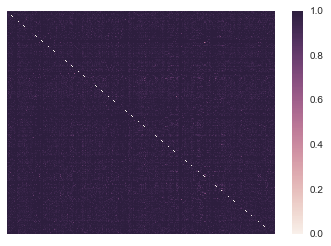

In [1]:
import xml.etree.ElementTree as et
import pandas as pd
import re
import numpy as np
import sklearn.metrics as metrics
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction import DictVectorizer
from sklearn.metrics import pairwise_distances
from scipy.spatial.distance import cosine
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl

%matplotlib inline

gid=[]
fid=[]
pid=[]
oid=[]
gtag=[]


for event, elem in et.iterparse('/Users/abhyudaya/stackoverflowdata/stackoverflow-posts-2015.xml', events=('start', 'end', 'start-ns', 'end-ns')):
    for row in elem.findall('row'):
        Id=row.get('Id')
        ParentId=row.get('ParentId')
        OwnerUserId=row.get('OwnerUserId')
        Tags=row.get('Tags')
        PostTypeId=row.get('PostTypeId')
        if PostTypeId=='2':
            gid.append(Id)
            pid.append(ParentId)
            oid.append(OwnerUserId)
        if PostTypeId=='1':
            fid.append(Id)
            if Tags != None:
                tag = re.split('<|>', Tags)
            else:
                tag[1] = "None"
            gtag.append(tag[1])

data = {'Id': gid,'OwnerUserId': oid}
dataframe1=pd.DataFrame(data)

dataframe2=dataframe1.groupby('OwnerUserId').count()
dataframe3=dataframe2.sort_values(by='Id', ascending=[False])
dataframe4=dataframe3.head(1000)

data1 = {'OwnerUserId': oid, 'Id': pid}
dff=pd.DataFrame(data1)

lis = dataframe4.index.tolist()
data2 = {'OwnerUserId': lis}

dataframe6=pd.DataFrame(data2)

data3 = {'Id': fid, 'Tags': gtag}
df5=pd.DataFrame(data3)
merge1 = pd.merge(dataframe6, dff, on=['OwnerUserId'], how='inner')
merge2 = pd.merge(merge1, df5, on=['Id'], how='inner')
merge2.drop('Id', axis=1, inplace=True)



Taglist = merge2.groupby('OwnerUserId')['Tags'].apply(lambda x: x.tolist())

ll = []
for i in range(len(Taglist)):
    str1 = ' '.join(Taglist[i])
    ll.append(str1)
    

vector = CountVectorizer(min_df=1)
tagvector=vector.fit_transform(ll)
vectoArray = tagvector.toarray()
pairwise_distance = metrics.pairwise_distances(vectoArray,Y=None,metric='jaccard', n_jobs=1)
print pairwise_distance
sns.heatmap(pairwise_distance, xticklabels=False, yticklabels=False, linewidths=0)

Got the top 1000 users by using aggregate on the pandas data frame. Got the first tag for the questions answered by users. To apply distance function I converted them to vectors. Calculated distance using jaccard method.

Let's plot a subset of the distance matrix. Order the pairwise distance in your distance matrix (excluding the entries along the diagonal) in increasing order and pick user pairs until you have 100 unique users. See [Lecture 3](https://github.com/datascience16/lectures/blob/master/Lecture3/Distance-Functions.ipynb) for examples. **(10 pts)**

In [25]:
dist = pairwise_distance.flatten()

inde =np.argsort(dist)[::-1]

indexval = inde % 1000

index = indexval[:100]


users =pd.DataFrame(index)
users.columns=['index1']
#print users

merge2['index1'] = merge2.index


finalusers = pd.merge(merge2, users, on=['index1'], how='inner')
del finalusers['index1']


Taglistfinal = finalusers.groupby('OwnerUserId')['Tags'].apply(lambda x: x.tolist())

lol = []
for i in range(0,len(Taglistfinal)):
    str1 = ' '.join(Taglistfinal[i])
    lol.append(str1)
    
vectorizer = CountVectorizer(min_df=1)
tagsvec = vectorizer.fit_transform(lol)

tagsarr= tagsvec.toarray()

sim = metrics.pairwise_distances(tagsarr,Y=None,metric='jaccard', n_jobs=1)
print sim

[[ 0.          1.          1.          0.66666667  1.          0.5         1.
   0.5         1.          1.          0.5         0.5         1.          1.        ]
 [ 1.          0.          1.          1.          1.          1.          1.
   1.          1.          1.          1.          1.          1.          1.        ]
 [ 1.          1.          0.          0.5         1.          1.          0.
   1.          0.          1.          1.          1.          0.          0.        ]
 [ 0.66666667  1.          0.5         0.          1.          0.5         0.5
   0.5         0.5         1.          0.5         0.5         0.5         0.5       ]
 [ 1.          1.          1.          1.          0.          1.          1.
   1.          1.          0.          1.          1.          1.          1.        ]
 [ 0.5         1.          1.          0.5         1.          0.          1.
   0.          1.          1.          0.          0.          1.          1.        ]
 [ 1.    

Got the 100 unique users by convertin gthe array to list along with indices. Sorted and got the top 100 and reframed the matrix.

Next, let's create some time series from the data. Look at the top 100 users with the most question posts. For each user, your time series will be the `CreationDate` of the questions posted by that user. You may want to make multiple time series for each user based on the first tag of the questions. Compare the time series using one of the methods discussed in class. Document your findings. **(30 pts)**

You may find the [pandas.DataFrame.resample module](http://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.resample.html) helpful.

In [4]:
import xml.etree.ElementTree as etree
import pandas as pd
import re
import numpy as np
import sklearn.metrics as metrics
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction import DictVectorizer
import numpy as np
from sklearn.metrics import pairwise_distances
from scipy.spatial.distance import cosine
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import datetime as dt

%matplotlib inline

a11=[]
b11=[]
c11=[]
d11=[]
e11=[]

for event, elem in etree.iterparse('/Users/abhyudaya/stackoverflowdata/stackoverflow-posts-2015.xml', events=('start', 'end', 'start-ns', 'end-ns')):

    for row in elem.findall('row'):
        OwnerUserId=row.get('OwnerUserId')
        Tags=row.get('Tags')
        Id=row.get('Id')
        CreationDate=row.get('CreationDate')
        PostTypeId=row.get('PostTypeId')
        if PostTypeId=='1':
            a11.append(CreationDate)
            b11.append(OwnerUserId)
            e11.append(Id)
            if Tags != None:
                tag = re.split('<|>', Tags)
            else:
                tag[1] = "None"
            c11.append(tag[1])

dat1 = {'CreationDate': a11,'OwnerUserId': b11,'Tags':c11,'Id':e11 }
d11=pd.DataFrame(dat1)

newpd=pd.DataFrame()



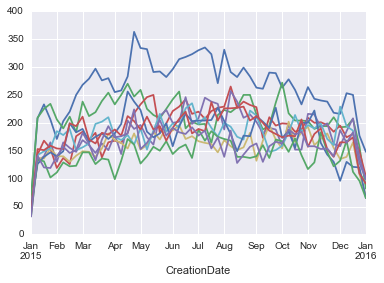

In [6]:
for tag in ['javascript', 'java','php','c#','android','python','ios','c++','html','jquery']:
    
    d15=d11.loc[d11['Tags'] == tag]

        

    d21=d15.groupby('OwnerUserId').count()
    d31=d21.sort_values(by='Id', ascending=[False])
    d41=d31.head(100)



    dat11 = {'OwnerUserId': b11, 'Tags': c11, 'CreationDate':a11}
    dff1=pd.DataFrame(dat11)

    lis = d41.index.tolist()


    dat2 = {'OwnerUserId': lis}
    df20=pd.DataFrame(dat2)

    mrg1 = pd.merge(df20, dff1, on=['OwnerUserId'], how='inner')

    mrg1 = mrg1.set_index(pd.DatetimeIndex(mrg1['CreationDate']))


    times = pd.to_datetime(mrg1.CreationDate)

    data100=mrg1.groupby([times]).Tags.count().resample('W',how='sum')
    df100=pd.DataFrame(data100)
    newpd=pd.concat([df100,newpd],axis=1,join='inner')


    data100.plot()

    #plt.show()
     

Using resampling technique with creation date as index got the tags on which top users posted questions.
Took top 10 popular tags and created weekly time series to know the topics these users posted the questions on.
To obtain the two most similar and two most different time series I created a pandas dataframe for all the created date time slots and the corresponding count of tags by the users in these slots. Converted the dataframe to a dictionary to vectorize and then run the jaccard distance function to know the similarity between the time frames.

Plot the 2 most similar and the 2 most different time series. **(10 pts)**

[[ 0.          1.          1.          0.66666667  1.          0.5         1.
   0.5         1.          1.          0.5         0.5         1.          1.        ]
 [ 1.          0.          1.          1.          1.          1.          1.
   1.          1.          1.          1.          1.          1.          1.        ]
 [ 1.          1.          0.          0.5         1.          1.          0.
   1.          0.          1.          1.          1.          0.          0.        ]
 [ 0.66666667  1.          0.5         0.          1.          0.5         0.5
   0.5         0.5         1.          0.5         0.5         0.5         0.5       ]
 [ 1.          1.          1.          1.          0.          1.          1.
   1.          1.          0.          1.          1.          1.          1.        ]
 [ 0.5         1.          1.          0.5         1.          0.          1.
   0.          1.          1.          0.          0.          1.          1.        ]
 [ 1.    

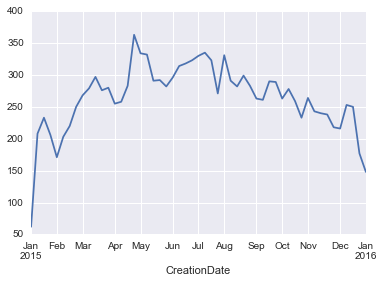

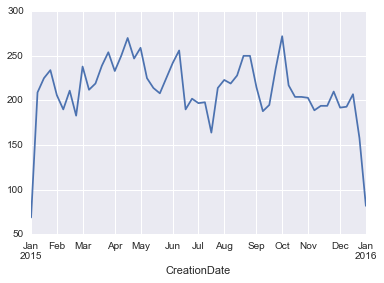

Most different time series


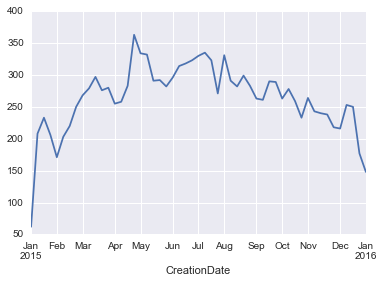

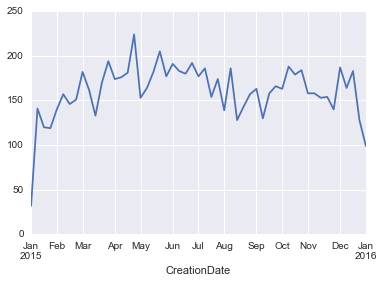

In [27]:
newlist=newpd.values.T.tolist()

newdic=newpd.to_dict()

vectorizer = CountVectorizer(min_df=1) 
tagsvec = vectorizer.fit_transform(newdic)  
tagsarr= tagsvec.toarray()  
sim = metrics.pairwise_distances(tagsarr,Y=None,metric='jaccard', n_jobs=1)
print sim
for tag in ['javascript', 'java']:
    
    d15=d11.loc[d11['Tags'] == tag]

    d21=d15.groupby('OwnerUserId').count()
    d31=d21.sort_values(by='Id', ascending=[False])
    d41=d31.head(100)

    dat11 = {'OwnerUserId': b11, 'Tags': c11, 'CreationDate':a11}
    dff1=pd.DataFrame(dat11)

    lis = d41.index.tolist()
    dat2 = {'OwnerUserId': lis}
    df20=pd.DataFrame(dat2)

    mrg1 = pd.merge(df20, dff1, on=['OwnerUserId'], how='inner')

    mrg1 = mrg1.set_index(pd.DatetimeIndex(mrg1['CreationDate']))


    times = pd.to_datetime(mrg1.CreationDate)

    data100=mrg1.groupby([times]).Tags.count().resample('W',how='sum')
    df100=pd.DataFrame(data100)
    newpd=pd.concat([df100,newpd],axis=1,join='inner')
    
    
    data100.plot()
    plt.show()
    
print "Most different time series" 
for tag in ['javascript', 'jquery']:
    
    d15=d11.loc[d11['Tags'] == tag]

        

    d21=d15.groupby('OwnerUserId').count()
    d31=d21.sort_values(by='Id', ascending=[False])
    d41=d31.head(100)



    dat11 = {'OwnerUserId': b11, 'Tags': c11, 'CreationDate':a11}
    dff1=pd.DataFrame(dat11)


    lis = d41.index.tolist()


    dat2 = {'OwnerUserId': lis}
    df20=pd.DataFrame(dat2)

    mrg1 = pd.merge(df20, dff1, on=['OwnerUserId'], how='inner')

    mrg1 = mrg1.set_index(pd.DatetimeIndex(mrg1['CreationDate']))


    times = pd.to_datetime(mrg1.CreationDate)

    data100=mrg1.groupby([times]).Tags.count().resample('W',how='sum')
    df100=pd.DataFrame(data100)
    newpd=pd.concat([df100,newpd],axis=1,join='inner')
    
    
    data100.plot()
    plt.show()
    

In [8]:
# Code for setting the style of the notebook
from IPython.core.display import HTML
def css_styling():
    styles = open("/Users/abhyudaya/cs591_aalva/class_notes/lectures/theme/custom.css", "r").read()
    return HTML(styles)
css_styling()